In [1]:
import math
import numpy as np
from scipy import integrate
from scipy.stats import norm
from matplotlib import pyplot as plt
import random
import concurrent.futures
import os
import pickle

%matplotlib inline
tau = 2 * math.pi
pi = math.pi
random.seed(666)

import profiles as P

with open("naca0012.dat", "r") as f:
    x, y = np.loadtxt(f, dtype = float, delimiter="\t", unpack = True)

freestream_4 = P.Freestream(u_inf = 1, alpha = 4)

NACA0012 = P.Profile(x,y)
NACA0012.get_aero(freestream_4)
NACA0012.get_limitations()
NACA0012.get_aero(freestream_4)
NACA0012.get_limitations()

In [2]:
def inner_penalty_function(profile):
    if profile.roughness < 2:
        return profile.roughness
    else:
        return (profile.roughness-2)**2

CL_NACA0012 = NACA0012.cl
shadow_NACA0012 = NACA0012.shadow
r = 0.1

def abc_penalty_function(profile, gen: int, c: float, a: float, b: float, penalty_function: callable):
    return (c*gen)**a * inner_penalty_function(profile)**b

def general_objective_function(profile,  A: callable, B: callable, penalty_function: callable):
    fitness = A(profile.cl / CL_NACA0012) / B(profile.shadow / shadow_NACA0012) - penalty_function(profile)
    if fitness > 0:
        return fitness
    else:
        return 0
    
def objective_function_0(profile):
    return general_objective_function(profile, lambda x: x, lambda x: x, inner_penalty_function)
    
def objective_function_shadow_squared(profile):
    return general_objective_function(profile, lambda x: x, lambda x: x**2, inner_penalty_function)
    
def objective_function_shadow_tangens(profile):
    return general_objective_function(profile, lambda x: x, lambda x: np.tan, inner_penalty_function)

def objective_function_penalty_abc(profile, gen: int, c: float, a: float, b: float, inner_penalty_function: callable = inner_penalty_function):
    def penalty(profile):
        return abc_penalty_function(profile, gen = gen, c = c, a = a, b = b, penalty_function = inner_penalty_function)
    return general_objective_function(profile, lambda x: x, lambda x: x**2, penalty)

In [3]:
def mutate(p, mu_range = [0, 1], d_range = [-4, 4]):
    """
    mutates a given profile by denting
    mu - allowed range of dent's centre
    d - amplitude for the dent, scaled by NACA0012's vertical shadow
    """
    mu = random.uniform(mu_range[0], mu_range[1])
    d = random.uniform(d_range[0], d_range[1]) * shadow_NACA0012
    p.dent(mu, d)
    p.get_aero(freestream_4)
    p.get_limitations()
    
def chance_mutate(p, mu_range = [0, 1], d_range = [-4, 4], prob = 0.5):
    """
    has a prob probability of mutating profile p. default prob = 1/2
    """
    if random.uniform(0, 1) < prob:
        mutate(p, mu_range, d_range)
    print(f"mutated {p.ID}")
    
def make_children(P, mu_range = [0, 1], d_range = [-4, 4], prob = 0.5, n = 10):
    def fun(P):
        return chance_mutate(P, mu_range = mu_range, d_range = d_range, prob = prob)
    children = []
    for i in range(n):
        children.append(P.copy())
    with concurrent.futures.ThreadPoolExecutor() as executor:
        executor.map(fun, children) 
    print(f"***Finished children of {P.ID}***")
    return children

In [4]:
def roulette_wheel_selection(profiles):
    """
    returns ID of profile winning roulette wheel selection out of the given pool
    """
    total_fitness = sum([p.fitness for p in profiles])
    pick = random.uniform(0, total_fitness)
    current = 0
    for profile in profiles:
        current += profile.fitness
        if current > pick:
            return profile.ID

def crossover(p1, p2, k = None):
    """
    returns a profile crossed from 2 parents (front and back half)
    the slicing is random across the chord, unless specified (k=None)
    """
    x_1, y_1 = p1.x, p1.y
    x_2, y_2 = p2.x, p2.y
    N = len(x_1)

    if not k:
        k = random.uniform(0, 1)
    
    for i, x in enumerate(x_1):
        if x <= k:
            a = i
            b = N - 2 * a
            break
            
    x_upper_back = p1.x[:a]
    x_front = p2.x[a:a + b]
    x_lower_back = p1.x[a + b:]
    y_upper_back = p1.y[:a]
    y_front = p2.y[a:a + b]
    y_lower_back = p1.y[a + b:]
    x = np.concatenate((x_upper_back, x_front, x_lower_back))
    y = np.concatenate((y_upper_back, y_front, y_lower_back))
    return  P.Profile(x, y)

def roulette_crossover(profiles, k = None):
    """
    returns an offspring profile created by crossing 2 specimen in a given generation, using roulette selecting
    """
    p1_ID = roulette_wheel_selection(profiles)
    p2_ID = roulette_wheel_selection([p for p in profiles if p.ID != p1_ID])
    p1 = [p for p in profiles if p.ID == p1_ID ][0]
    p2 = [p for p in profiles if p.ID == p2_ID ][0]
    offspring = crossover(p1, p2, k = k)
    offspring.get_aero(freestream_4)
    offspring.get_limitations()
    return offspring

In [5]:
def create_offspring(profiles, mu_range = [0, 1], d_range = [-4, 4], prob = 0.5, n = 100):
    def fun(P):
        return chance_mutate(P, mu_range, d_range, prob)
    children = []
    for i in range(n):
        children.append(roulette_crossover(profiles))
    with concurrent.futures.ThreadPoolExecutor() as executor:
        executor.map(fun, children)
    print(f"***Finished creating offspring***")
    return children   

In [14]:
with (open("generations_c050a2b2", "rb")) as pkl:
    generations = pickle.load(pkl)

In [15]:
for i in range(200):
    generations.append(create_offspring(generations[-1], d_range = [-0.01, 0.01], n = 1000, prob = 0.1))
    for p in generations[-1]:
        p.fitness = objective_function_penalty_abc(p, gen = i + 2, c = 0.50, a = 2, b = 2)

mutated 43
mutated 44
mutated 45
mutated 46
mutated 47
mutated 48
mutated 49
mutated 50
mutated 51
mutated 53
mutated 54
mutated 55
mutated 56
mutated 57
mutated 58
mutated 59
mutated 60
mutated 61
mutated 42
mutated 62
mutated 63
mutated 64
mutated 65
mutated 68
mutated 69
mutated 70
mutated 71
mutated 72
mutated 73
mutated 74
mutated 75
mutated 76
mutated 77
mutated 78
mutated 79
mutated 80
mutated 81
mutated 52
mutated 82
mutated 83
mutated 84
mutated 85
mutated 86
mutated 87
mutated 88
mutated 89
mutated 90
mutated 67
mutated 91
mutated 92
mutated 93
mutated 94
mutated 95
mutated 96
mutated 97
mutated 98
mutated 99
mutated 100
mutated 66
mutated 101
mutated 103
mutated 107
mutated 108
mutated 109
mutated 110
mutated 111
mutated 112
mutated 113
mutated 114
mutated 115
mutated 116
mutated 117
mutated 118
mutated 119
mutated 120
mutated 121
mutated 122
mutated 123
mutated 125
mutated 126
mutated 128
mutated 130
mutated 131
mutated 132
mutated 133
mutated 134
mutated 135
mutated 136
mu

In [28]:
generations_1 = generations[:50]
generations_2 = generations[50:100]
generations_3 = generations[100:150]
generations_4 = generations[150:200]
generations_5 = generations[200:]

In [29]:
with open("generations_final_search_c050a2b2_1", "wb") as pkl:
    pickle.dump(generations_1, pkl, protocol = pickle.HIGHEST_PROTOCOL)
with open("generations_final_search_c050a2b2_2", "wb") as pkl:
    pickle.dump(generations_2, pkl, protocol = pickle.HIGHEST_PROTOCOL)
with open("generations_final_search_c050a2b2_3", "wb") as pkl:
    pickle.dump(generations_3, pkl, protocol = pickle.HIGHEST_PROTOCOL)
with open("generations_final_search_c050a2b2_4", "wb") as pkl:
    pickle.dump(generations_4, pkl, protocol = pickle.HIGHEST_PROTOCOL)
with open("generations_final_search_c050a2b2_5", "wb") as pkl:
    pickle.dump(generations_5, pkl, protocol = pickle.HIGHEST_PROTOCOL)

In [7]:
with (open("generations_final_search_c050a2b2_1", "rb")) as pkl:
    generations_1 = pickle.load(pkl)
with (open("generations_final_search_c050a2b2_2", "rb")) as pkl:
    generations_2 = pickle.load(pkl)
with (open("generations_final_search_c050a2b2_3", "rb")) as pkl:
    generations_3 = pickle.load(pkl)
with (open("generations_final_search_c050a2b2_4", "rb")) as pkl:
    generations_4 = pickle.load(pkl)
with (open("generations_final_search_c050a2b2_5", "rb")) as pkl:
    generations_5 = pickle.load(pkl)

generations = [*generations_1, *generations_2, *generations_3, *generations_4, *generations_5]
len(generations)

221

In [8]:
avg_fitness = []
max_fitness = []
for i, gen in enumerate(generations):
    if i < 220:
        avg = 0
        maxi = 0
        for p in gen:
            avg += p.fitness
            maxi = max([maxi, p.fitness])
        avg = avg / len(gen)
        avg_fitness.append((avg, i+1))
        max_fitness.append((maxi, i+1))

In [9]:
avg_fitness_smooth = []
max_fitness_smooth = []
for i, gen in enumerate(generations):
    if i < 220:
        avg = 0
        maxi = 0
        k = 0
        for p in gen:
            if p.roughness < 3:
                avg += p.fitness
                maxi = max([maxi, p.fitness])
                k += 1
        if k != 0:
            avg = avg / k
        else:
            avg = 0
        avg_fitness_smooth.append((avg, i+1))
        max_fitness_smooth.append((maxi, i+1))

In [10]:
max_fitness_smooth[100], max_fitness[100]

((267416968.9452157, 101), (267416968.9452157, 101))

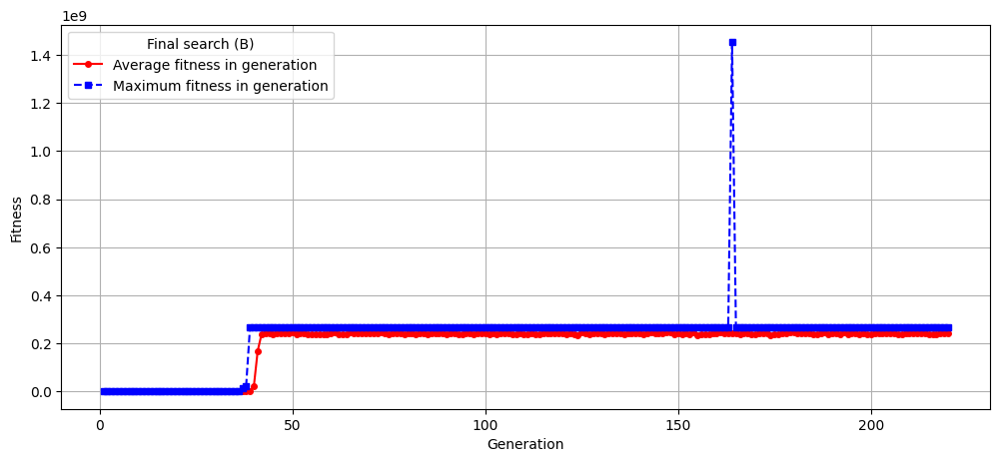

In [11]:
plt.figure(figsize=(12,5))
ytmp, xtmp = zip(*avg_fitness)
plt.plot(xtmp, ytmp, color = "red", marker = "o", markersize = "4", linestyle = "solid")
ytmp, xtmp = zip(*max_fitness)
plt.plot(xtmp, ytmp, color = "blue", marker = "s", markersize = "4", linestyle = "dashed")
plt.ylabel("Fitness")
plt.xlabel("Generation")
plt.grid("True")
plt.legend(["Average fitness in generation", "Maximum fitness in generation"],
          title = "Final search (B)")

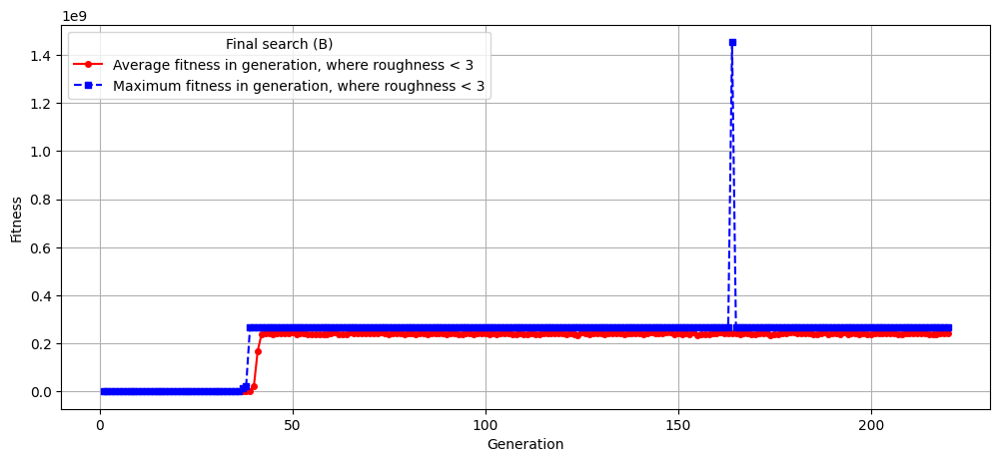

In [12]:
plt.figure(figsize=(12,5))
ytmp, xtmp = zip(*avg_fitness_smooth)
plt.plot(xtmp, ytmp, color = "red", marker = "o", markersize = "4", linestyle = "solid")
ytmp, xtmp = zip(*max_fitness_smooth)
plt.plot(xtmp, ytmp, color = "blue", marker = "s", markersize = "4", linestyle = "dashed")
plt.ylabel("Fitness")
plt.xlabel("Generation")
plt.grid("True")
plt.legend(["Average fitness in generation, where roughness < 3", "Maximum fitness in generation, where roughness < 3"],
          title = "Final search (B)")

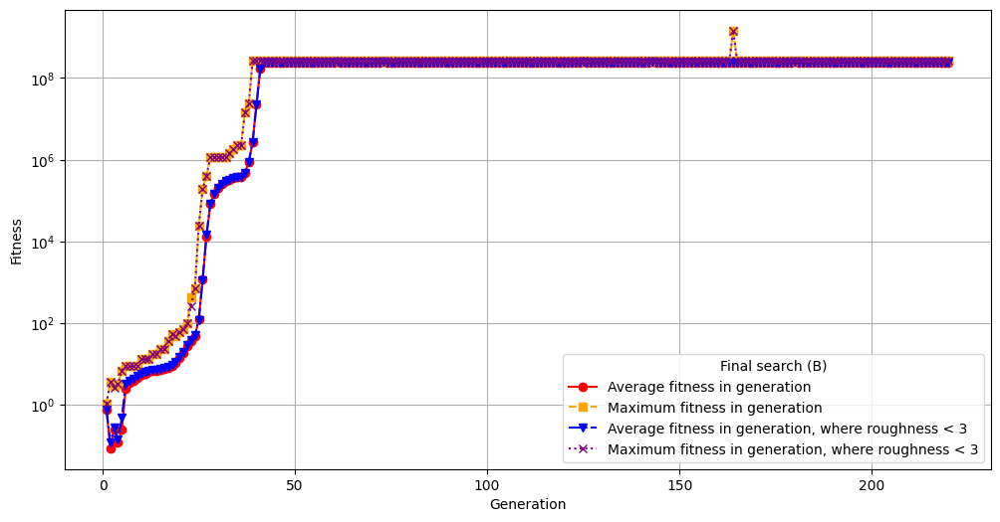

In [28]:
plt.figure(figsize=(12,6))
ytmp, xtmp = zip(*avg_fitness)
plt.plot(xtmp, ytmp, color = "red", marker = "o", markersize = "6", linestyle = "solid")
ytmp, xtmp = zip(*max_fitness)
plt.plot(xtmp, ytmp, color = "orange", marker = "s", markersize = "6", linestyle = "dashed")
ytmp, xtmp = zip(*avg_fitness_smooth)
plt.plot(xtmp, ytmp, color = "blue", marker = "v", markersize = "6", linestyle = "dashdot")
ytmp, xtmp = zip(*max_fitness_smooth)
plt.plot(xtmp, ytmp, color = "purple", marker = "x", markersize = "6", linestyle = "dotted")
plt.yscale('log')
plt.ylabel("Fitness")
plt.xlabel("Generation")
plt.grid("True")
plt.legend(["Average fitness in generation", "Maximum fitness in generation",
            "Average fitness in generation, where roughness < 3", "Maximum fitness in generation, where roughness < 3"],
          title = "Final search (B)")

In [14]:
bests = []
for gen in generations:
    bests.append(max(gen, key = lambda x: x.fitness))
best = max(bests, key = lambda x: x.fitness)

bests_constrained = []
for gen in generations:
    try:
        bests_constrained.append(max([p for p in gen if p.roughness < 3], key = lambda x: x.fitness))
    except:
        pass
best_constrained = max(bests_constrained, key = lambda x: x.fitness)

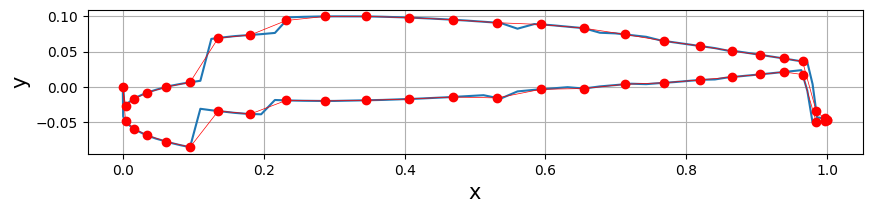

In [15]:
best_constrained.draw()

In [17]:
best_constrained.cl

1759821884.8580453

In [21]:
best_constrained.fitness

1452962180.7735462

In [25]:
for p in bests_constrained:
    print(p.fitness)

1.0764386603097562
3.7665966584296147
2.649858994505265
3.2821820210597457
6.976554850829595
8.926631739086737
8.833141131188766
8.833141131188766
8.881441878281368
13.111949557847854
13.177399790853809
13.61778333802401
17.327106156591732
17.280702143185195
23.648177785331864
23.03269399282848
35.98893928776308
55.15082487588001
49.47221819467062
62.2691782350957
73.85924846792727
99.93232587391704
268.08974144748066
735.6827579880212
23772.600201672463
189431.0911453056
410470.65025519254
1141196.032574563
1141196.032574563
1141196.032574563
1141196.032574563
1141196.032574563
1483459.3252702043
1781743.08613507
2234016.6591701615
2234016.6591701615
14210915.84697716
23705516.259341937
267416968.9452157
267416968.9452157
267416968.9452157
267416968.9452157
267416968.9452157
267416968.9452157
267416968.9452157
267416968.9452157
267416968.9452157
267416968.9452157
267416968.9452157
267416968.9452157
267416968.9452157
267416968.9452157
267416968.9452157
267416968.9452157
267416968.94521

C:\Users\ejwod\AeroPython\profiles.py:212: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize = (width, height))


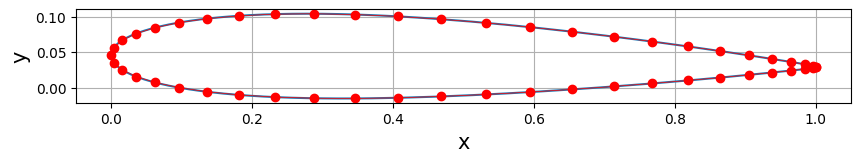

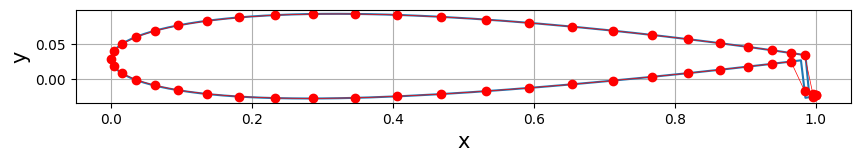

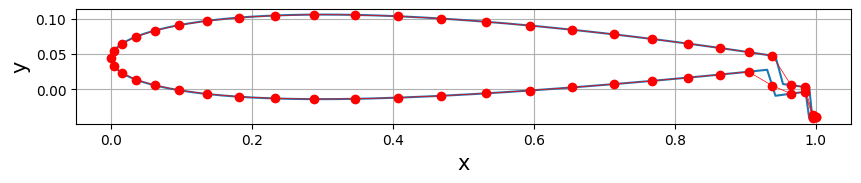

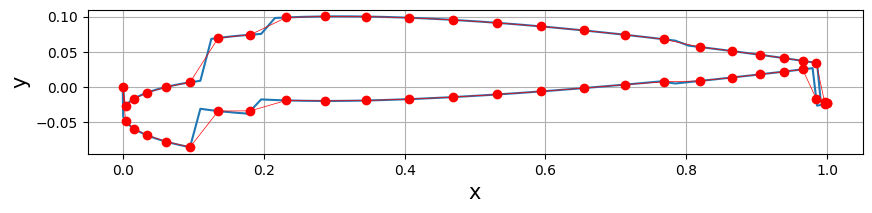

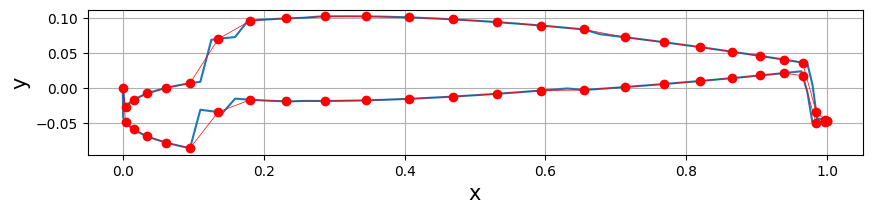

...

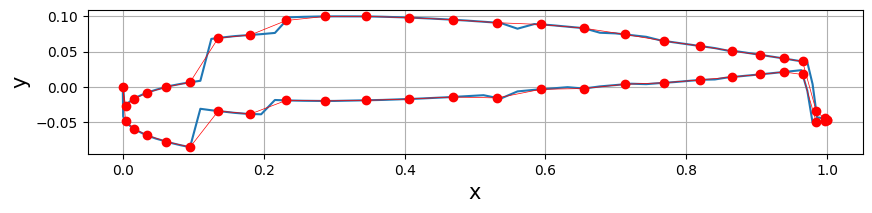

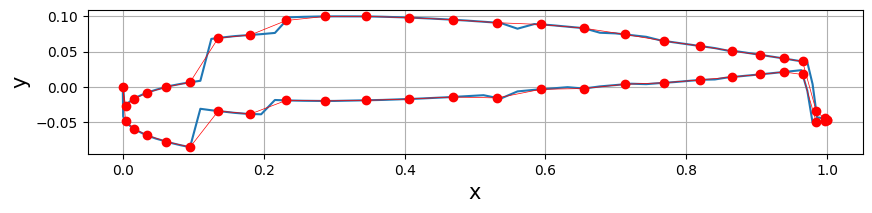

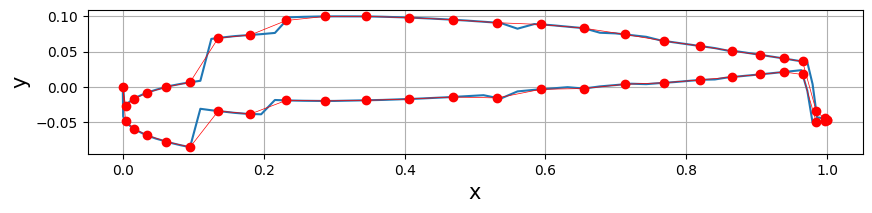

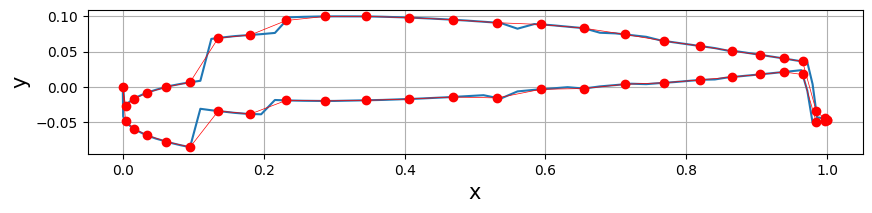

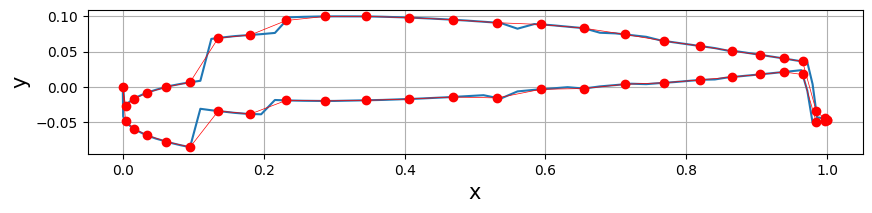

In [16]:
for p in bests_constrained:
    p.draw()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


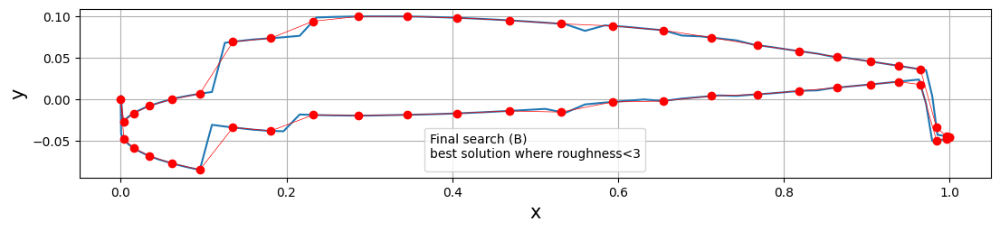

In [18]:
def custom_draw(P, description = None, width = 13, height = 13):
    panels = P.panels
    x = P.x
    y = P.y
    
    
    plt.figure(figsize = (width, height))
    plt.grid()
    plt.xlabel("x", fontsize = 15)
    plt.ylabel("y", fontsize = 15)
    plt.plot(x, y)
    plt.axis("scaled")
    # plt.xlim(0.92, 1.01)
    # plt.ylim(-0.05, 0.02)
    plt.plot(np.append([panel.x_a for panel in panels], panels[0].x_a),
     np.append([panel.y_a for panel in panels], panels[0].y_a),
    marker = "o", color = "red", linewidth = 0.5)
    plt.legend(
          title = description)

custom_draw(best_constrained, "Final search (B)\nbest solution where roughness<3")

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


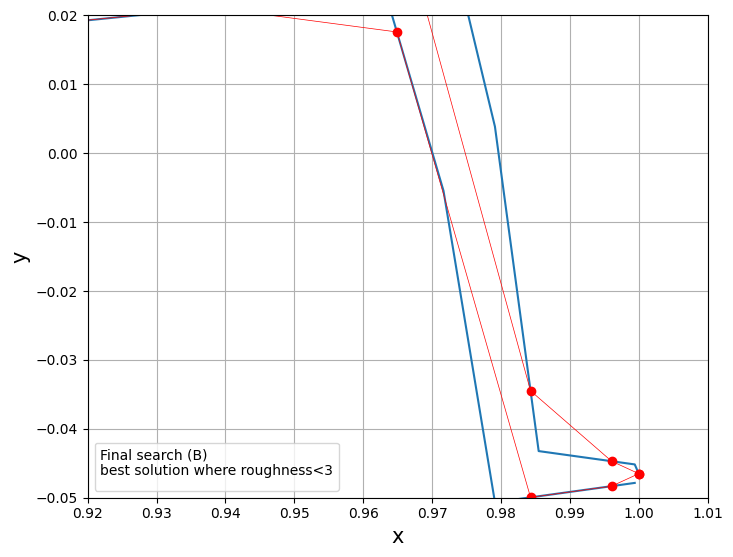

In [19]:
def custom_draw(P, description = None, width = 8, height = 8):
    panels = P.panels
    x = P.x
    y = P.y
    
    
    plt.figure(figsize = (width, height))
    plt.grid()
    plt.xlabel("x", fontsize = 15)
    plt.ylabel("y", fontsize = 15)
    plt.plot(x, y)
    plt.axis("scaled")
    plt.xlim(0.92, 1.01)
    plt.ylim(-0.05, 0.02)
    plt.plot(np.append([panel.x_a for panel in panels], panels[0].x_a),
     np.append([panel.y_a for panel in panels], panels[0].y_a),
    marker = "o", color = "red", linewidth = 0.5)
    plt.legend(
          title = description)

custom_draw(best_constrained, "Final search (B)\nbest solution where roughness<3")